In [31]:
import mne
file = "./test_data/chb01_03/chb01_03.edf"
data = mne.io.read_raw_edf(file)
raw_data = data.get_data().T
raw_data.shape


Extracting EDF parameters from /Users/sofiyagarkot/Desktop/Signals/coursework/test_data/chb01_03/chb01_03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-31-7857d481808a>:3: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data = mne.io.read_raw_edf(file)


(921600, 23)

# ICA for the whole signal

<Figure size 432x288 with 0 Axes>

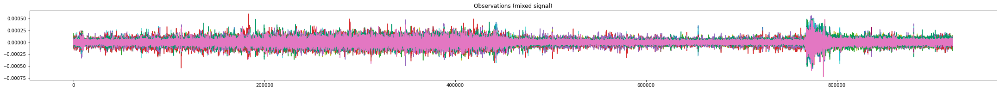

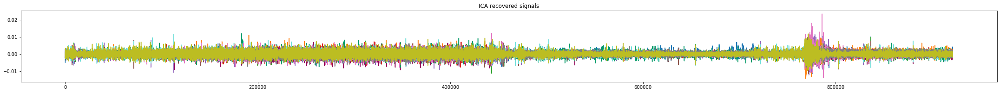

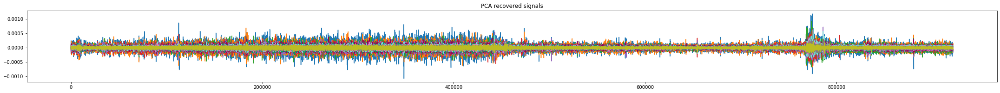

In [32]:
from sklearn.decomposition import FastICA
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

from sklearn.decomposition import FastICA, PCA

# #############################################################################
# Generate sample data
np.random.seed(0)

ica = FastICA(n_components=12)

S_ = ica.fit_transform(raw_data)  # Reconstruct signals
A_ = ica.mixing_  # Get estimated mixing matrix

# For comparison, compute PCA
pca = PCA(n_components=12)
H = pca.fit_transform(raw_data)  # Reconstruct signals based on orthogonal components

# #############################################################################
# Plot results

plt.figure()
COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#930157', '#009966', '#72dfd9', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
         '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#930157', '#009966', '#72dfd9', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


models = [raw_data, S_, H]
names = ['Observations (mixed signal)',
         'ICA recovered signals',
         'PCA recovered signals']
colors = ['red', 'steelblue', 'orange']

for ii, (model, name) in enumerate(zip(models, names), 1):
    fig = plt.figure(figsize=(30, 10))
    plt.subplot(4, 1, ii)
    plt.title(name)
    for sig, color in zip(model.T, COLORS):
#         fig = plt.figure(figsize=(30, 10))
        plt.plot(sig, color=color)

    plt.tight_layout()
    plt.show()
    


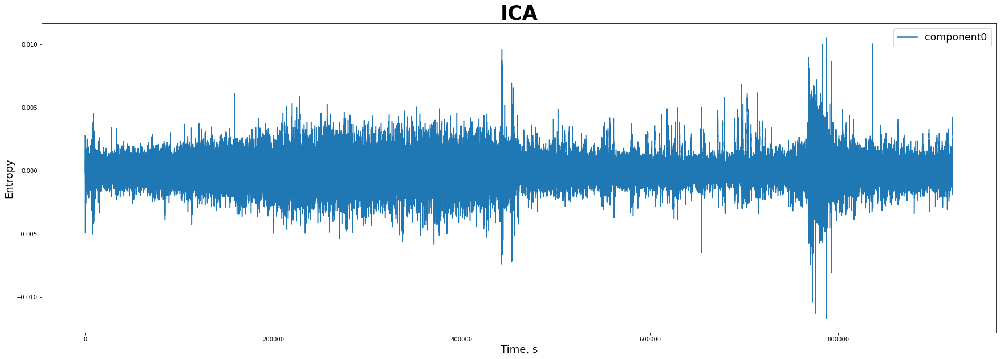

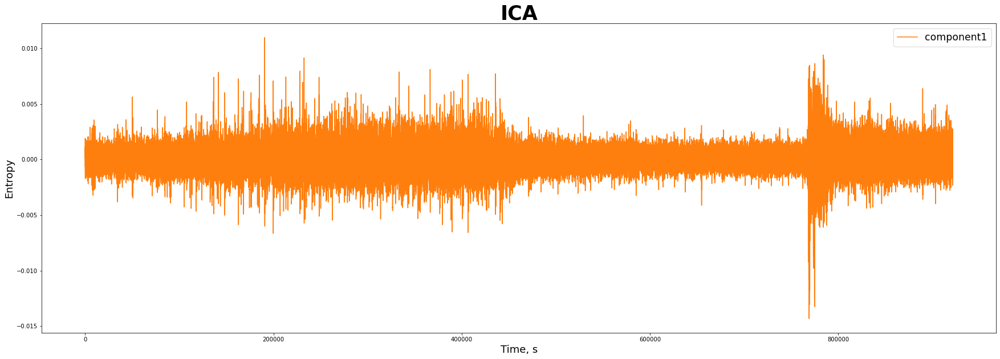

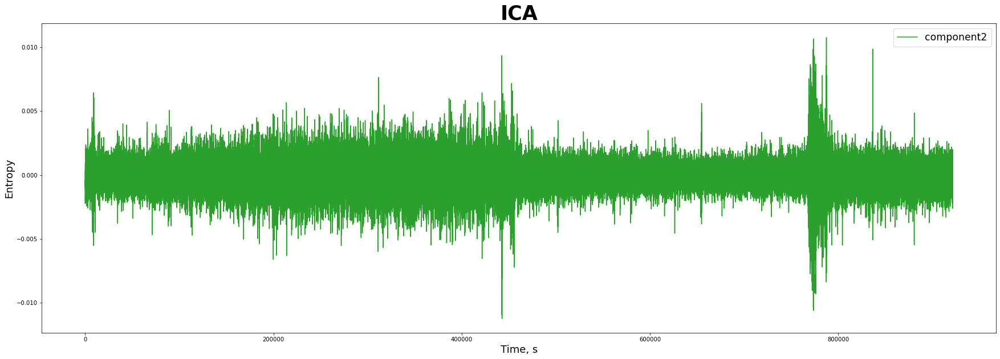

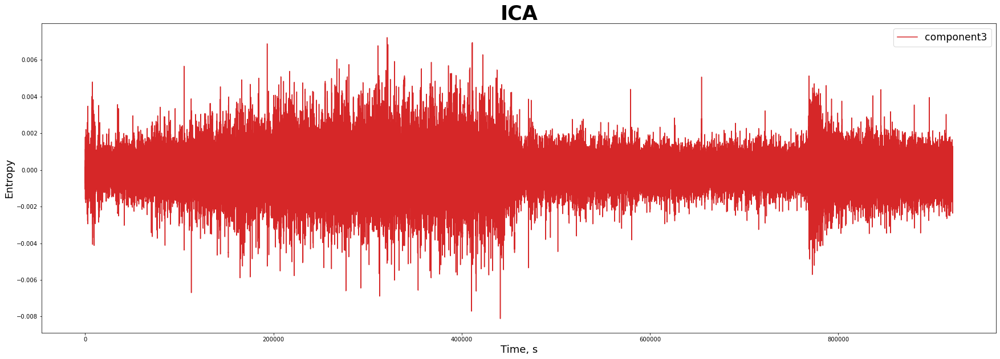

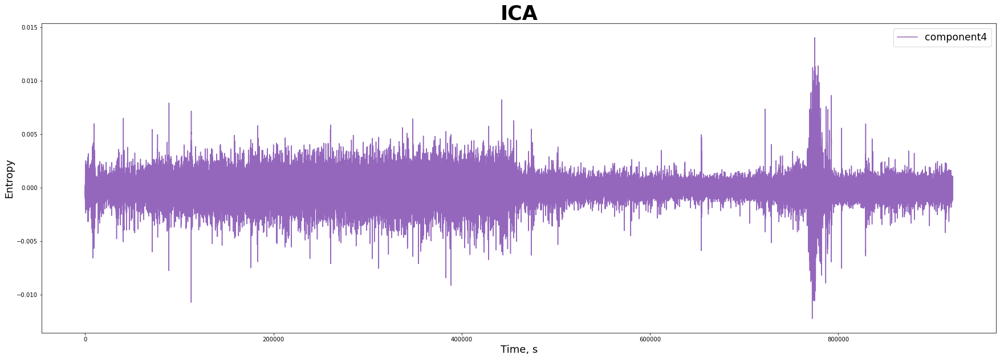

...

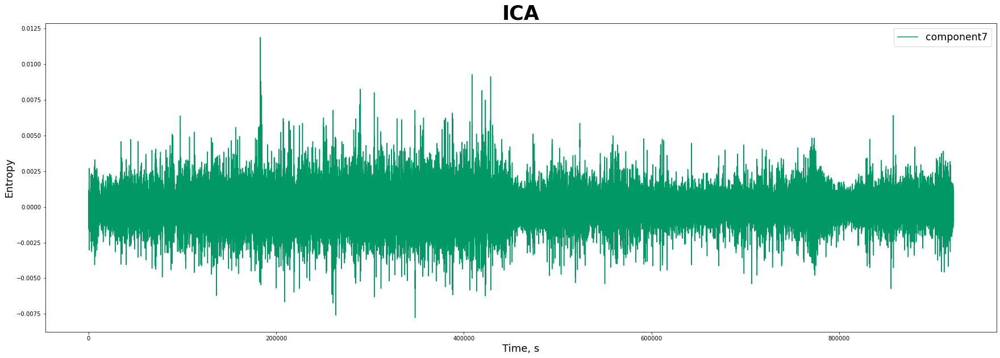

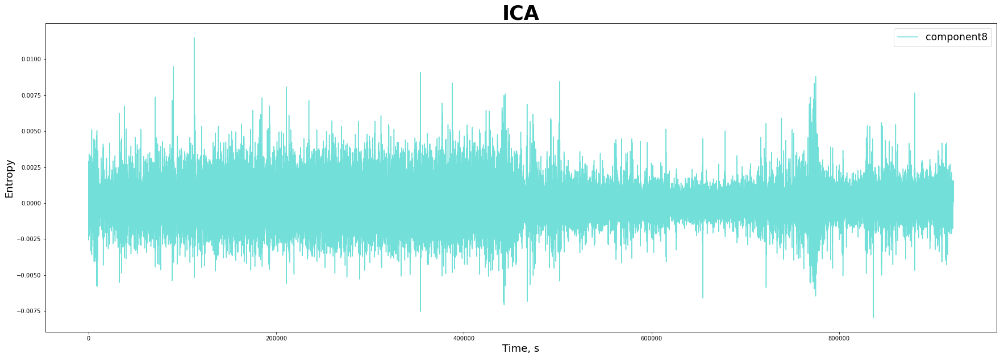

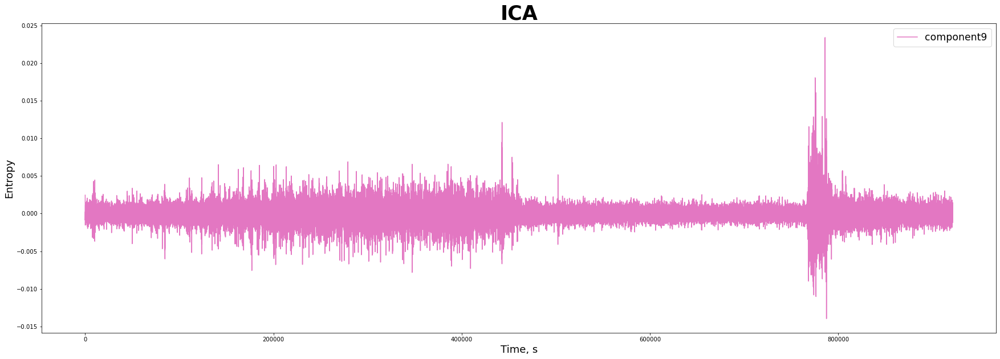

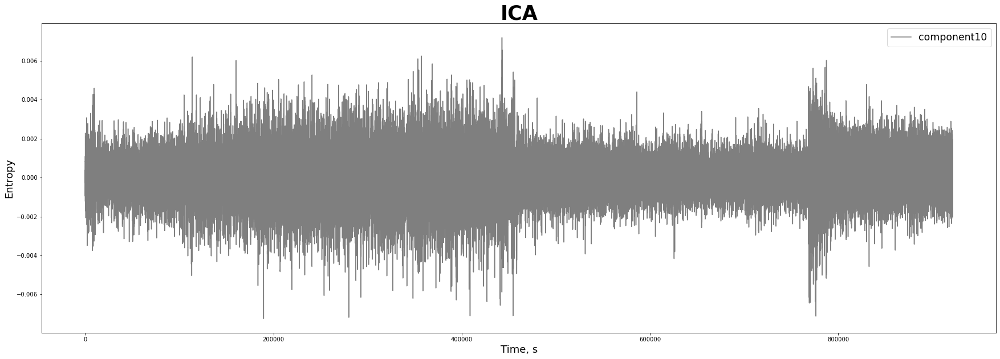

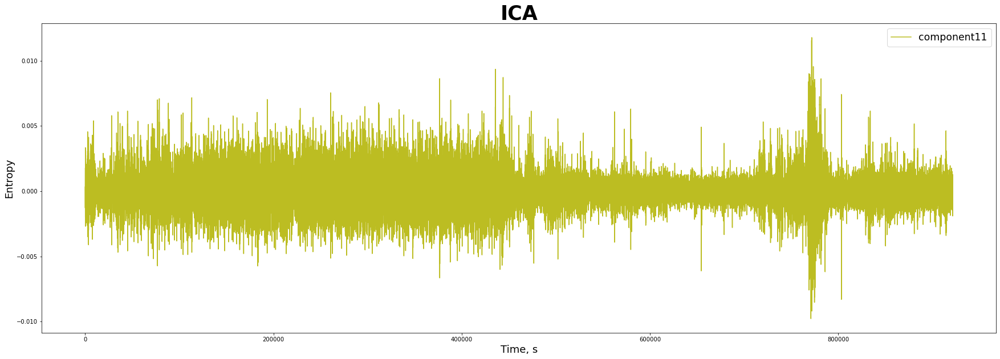

In [33]:
time = np.linspace(0, S_.shape[0]//256, S_.shape[0])
for i, component in enumerate(S_.T):
    fig = plt.figure(figsize=(30, 10))
    plt.plot(component, color=COLORS[i], label="component"+str(i))
    plt.xlabel('Time, s', fontsize=18)
    plt.ylabel('Entropy', fontsize=18)
    plt.title('ICA', weight='bold', fontsize=35)
    plt.legend(fontsize='xx-large')
    plt.show()

# ICA only 200 first seconds 

In [4]:
# raw_data = raw_data[:200*256]
# raw_data.shape

(51200, 23)

In [5]:
from sklearn.decomposition import FastICA

<Figure size 432x288 with 0 Axes>

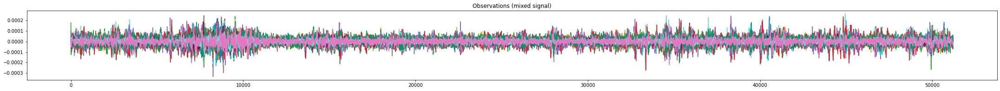

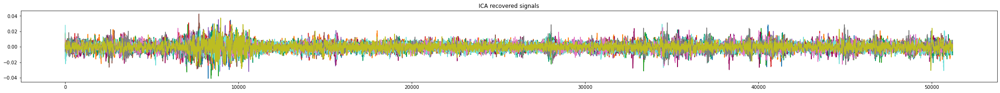

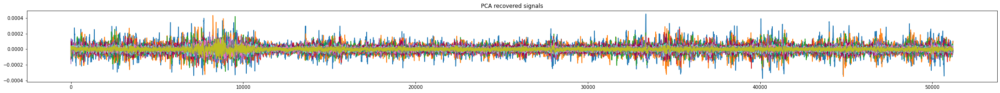

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

from sklearn.decomposition import FastICA, PCA

# #############################################################################
# Generate sample data
np.random.seed(0)

ica = FastICA(n_components=12)

S_ = ica.fit_transform(raw_data)  # Reconstruct signals
A_ = ica.mixing_  # Get estimated mixing matrix

# For comparison, compute PCA
pca = PCA(n_components=12)
H = pca.fit_transform(raw_data)  # Reconstruct signals based on orthogonal components

# #############################################################################
# Plot results

plt.figure()
COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#930157', '#009966', '#72dfd9', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
         '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#930157', '#009966', '#72dfd9', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


models = [raw_data, S_, H]
names = ['Observations (mixed signal)',
         'ICA recovered signals',
         'PCA recovered signals']
colors = ['red', 'steelblue', 'orange']

for ii, (model, name) in enumerate(zip(models, names), 1):
    fig = plt.figure(figsize=(30, 10))
    plt.subplot(4, 1, ii)
    plt.title(name)
    for sig, color in zip(model.T, COLORS):
#         fig = plt.figure(figsize=(30, 10))
        plt.plot(sig, color=color)

    plt.tight_layout()
    plt.show()

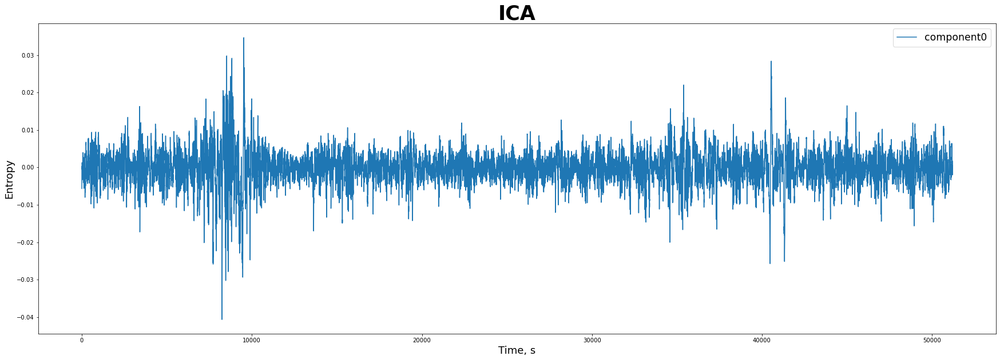

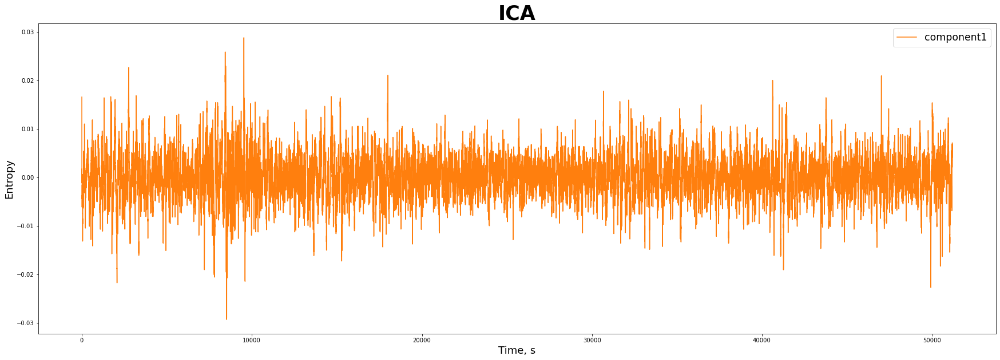

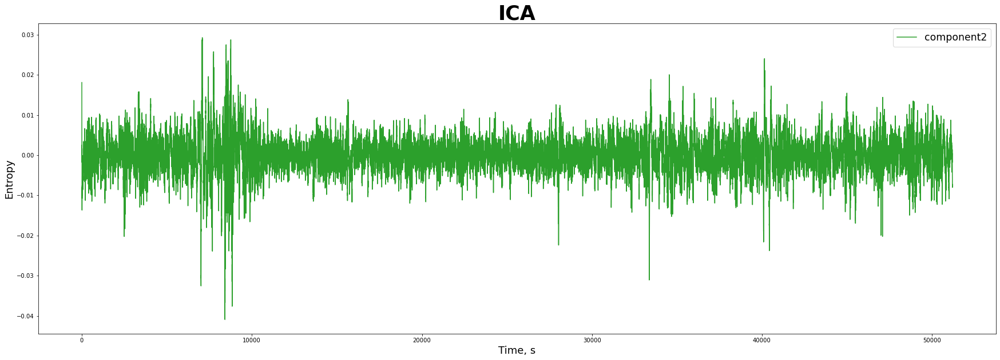

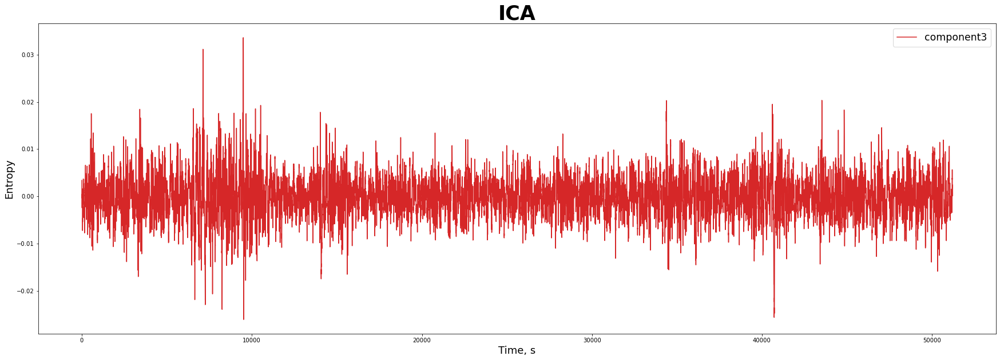

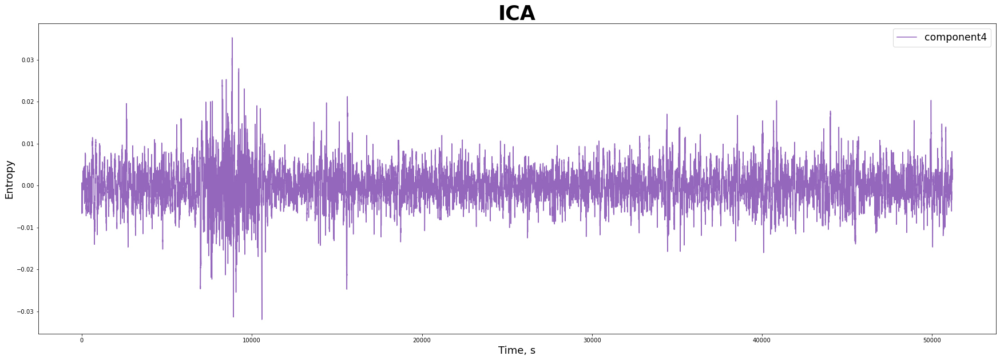

...

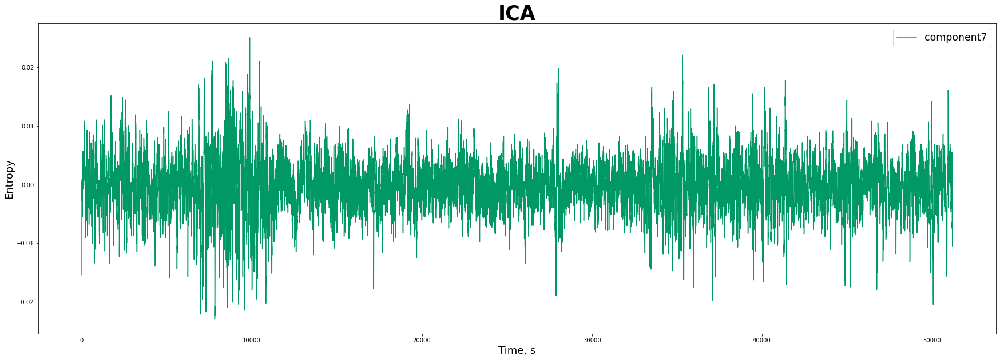

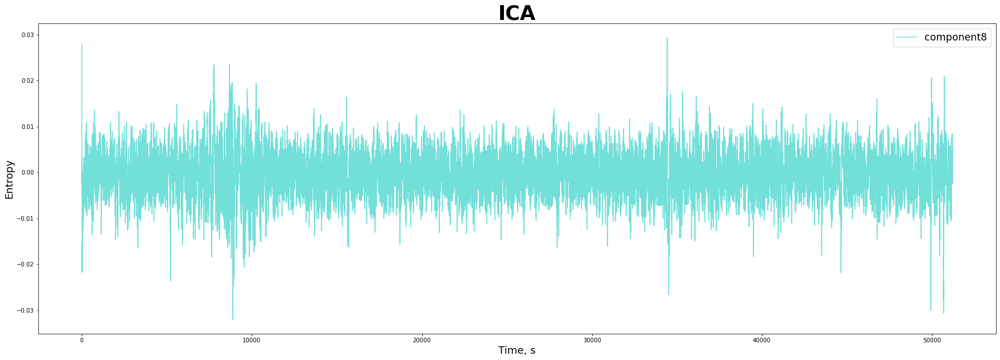

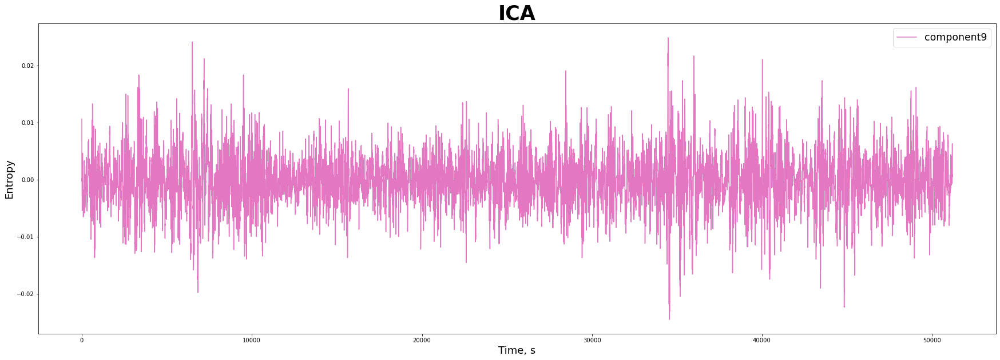

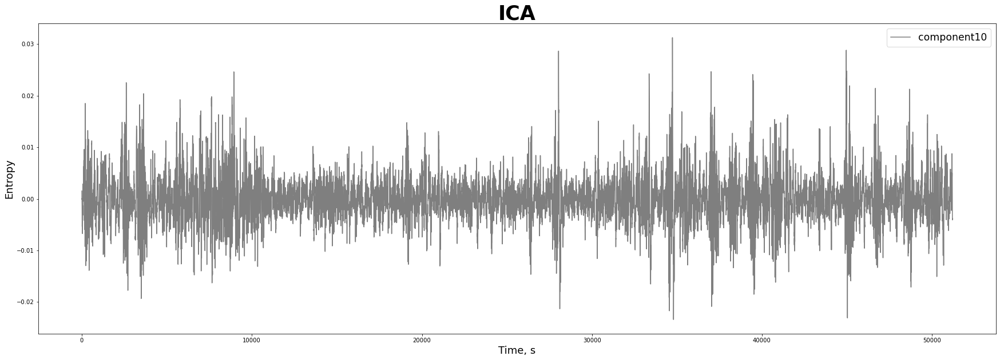

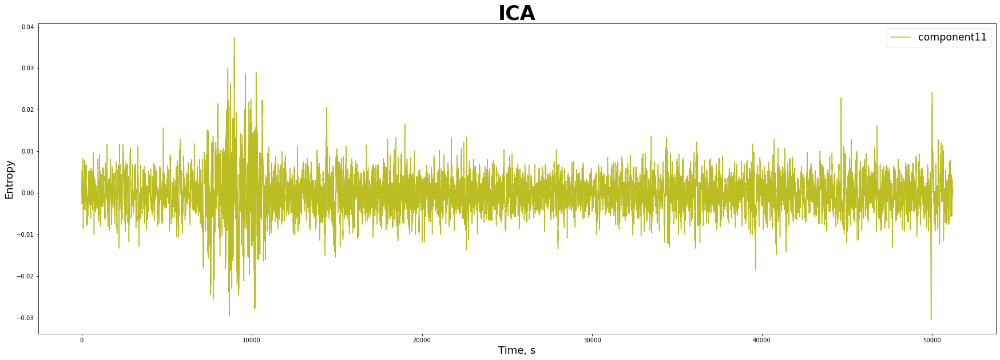

In [7]:
time = np.linspace(0, S_.shape[0]//256, S_.shape[0])
for i, component in enumerate(S_.T):
    fig = plt.figure(figsize=(30, 10))
    plt.plot(component, color=COLORS[i], label="component"+str(i))
    plt.xlabel('Time, s', fontsize=18)
    plt.ylabel('Entropy', fontsize=18)
    plt.title('ICA', weight='bold', fontsize=35)
    plt.legend(fontsize='xx-large')
    plt.show()


# Permutation entropy applied to IC

In [34]:
S_ = S_.T
S_.shape, raw_data.shape

((12, 921600), (921600, 23))

In [35]:
def permutation_entropy(time_series, m, delay):
    """Calculate the Permutation Entropy
 
    Args:
        time_series: Time series for analysis
        m: Order of permutation entropy
        delay: Time delay
 
    Returns:
        Vector containing Permutation Entropy
 
    Reference:
        [1] Massimiliano Zanin et al. Permutation Entropy and Its Main Biomedical and Econophysics Applications:
            A Review. http://www.mdpi.com/1099-4300/14/8/1553/pdf
        [2] Christoph Bandt and Bernd Pompe. Permutation entropy — a natural complexity
            measure for time series. http://stubber.math-inf.uni-greifswald.de/pub/full/prep/2001/11.pdf
        [3] http://www.mathworks.com/matlabcentral/fileexchange/37289-permutation-entropy/content/pec.m
    """
    n = len(time_series)
    permutations = np.array(list(itertools.permutations(range(m))))
    c = [0] * len(permutations)
 
    for i in range(n - delay * (m - 1)):
        # sorted_time_series =    np.sort(time_series[i:i+delay*m:delay], kind='quicksort')
        sorted_index_array = np.array(np.argsort(time_series[i:i + delay * m:delay], kind='quicksort'))
        for j in range(len(permutations)):
            if abs(permutations[j] - sorted_index_array).any() == 0:
                c[j] += 1
 
    c = [element for element in c if element != 0]
    p = np.divide(np.array(c), float(sum(c)))
    pe = -sum(p * np.log(p))/np.log(np.math.factorial(m))
    return pe

def signal_wise_entropy( fs, signal, window_duration, m, lag):
        number_of_periods = len(signal) // fs
        signal_entropy = []
        for starting_period in range(number_of_periods):
            signal_ = signal[starting_period * fs:(starting_period + window_duration) * fs]
            entropy = permutation_entropy(signal_, m, lag)
            signal_entropy.append(entropy)
        return signal_entropy

In [41]:
import itertools
def get_permutation_entropy_all_channels(multivariate_signal, window_duration, m, lag, seizure_time, window_before, window_after):

    permutation_en = []
    fs = 256
    count_start = (seizure_time[0] - window_before) * fs
    count_end = (seizure_time[1] + window_after) * fs
#         print("Self.raw_data",len(self.raw_data[0]), count_start, count_end)

    for s in range(multivariate_signal.shape[0]):
#         print("Counts", count_start, count_end)
#         print('Channel:', s, len(multivariate_signal[s]))
        signal = multivariate_signal[s][count_start:count_end]
#         print("Signal:", signal)
        
        signal_entropy = signal_wise_entropy(fs, signal, window_duration, m, lag)
#         print(len(signal_entropy))
        time_ = np.linspace(seizure_time[0] - window_before, seizure_time[1] + window_after, len(signal_entropy))

        fig = plt.figure(figsize=(30, 10))

        plt.plot(time_, signal_entropy, COLORS[s], label="Component "+str(s))
        plt.xlabel('Time, s', fontsize=18)
        plt.ylabel('Entropy', fontsize=18)
        plt.title('Permutation entropy as a function of time '+str(seizure_time), weight='bold', fontsize=35)
        plt.legend(fontsize='xx-large')
        plt.show()
            
        permutation_en.append(signal_entropy)

    return permutation_en

def get_averaged_permutation_entropy(multivariate_signal, window_duration, m, lag, seizure_time, window_before, window_after):
    print("Getting averaged")
    averaged_permutation_en = []
    permutation_en =  get_permutation_entropy_all_channels(multivariate_signal, window_duration, m, lag, seizure_time, window_before, window_after)
    for a in range(len(permutation_en[0])):
        value = []
        for vector in permutation_en:
            value.append(vector[a])
        averaged_permutation_en.append(sum(value) / len(value))

    return averaged_permutation_en

Getting averaged


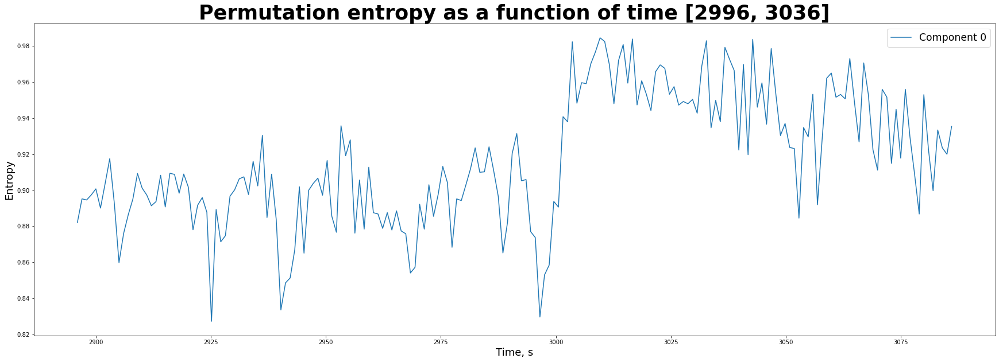

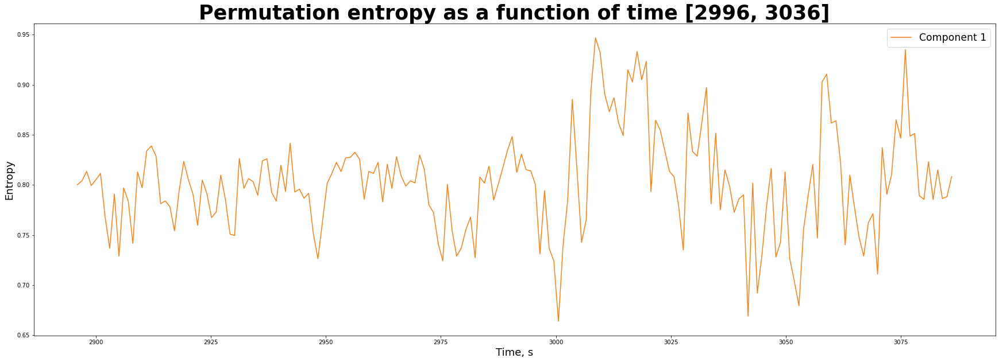

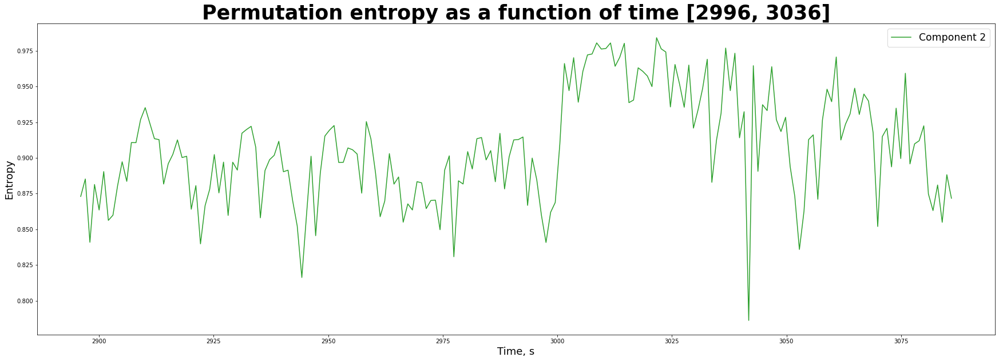

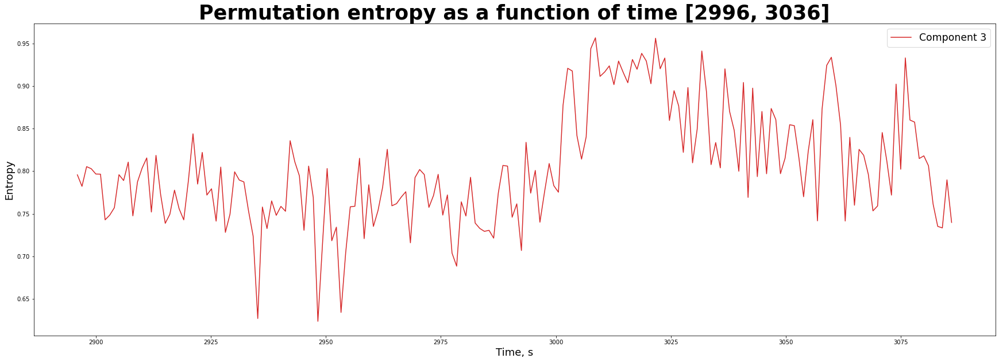

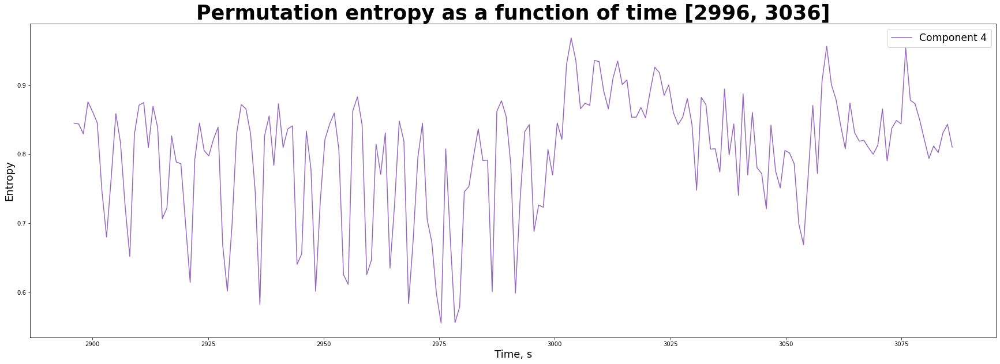

...

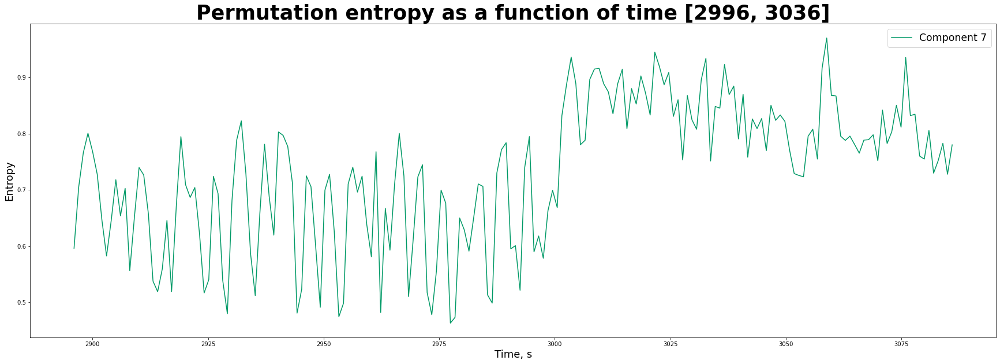

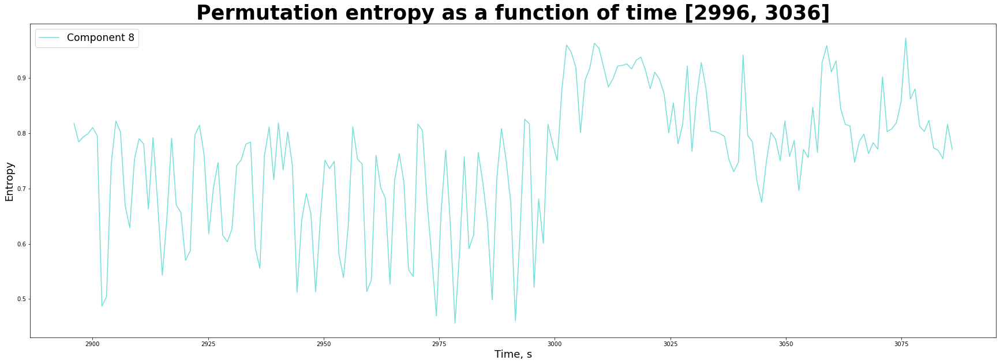

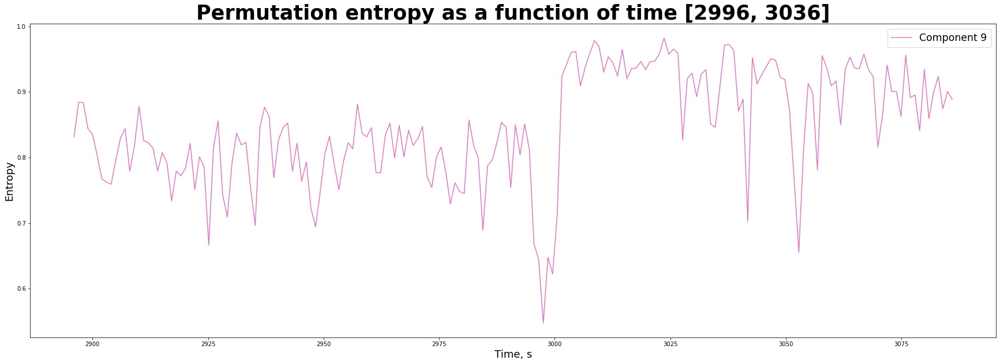

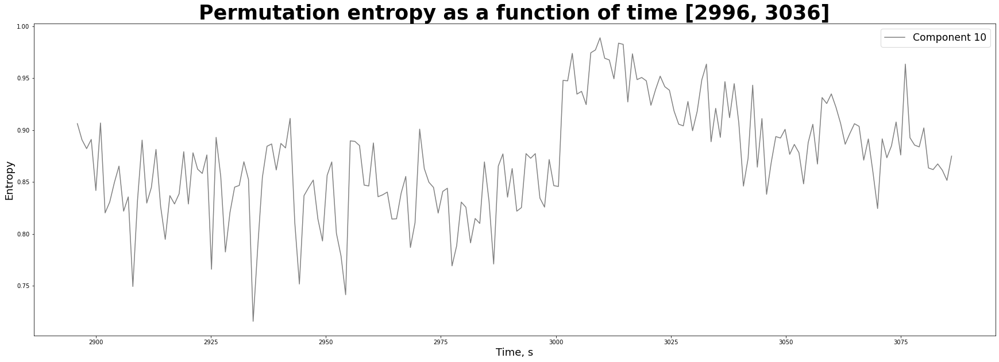

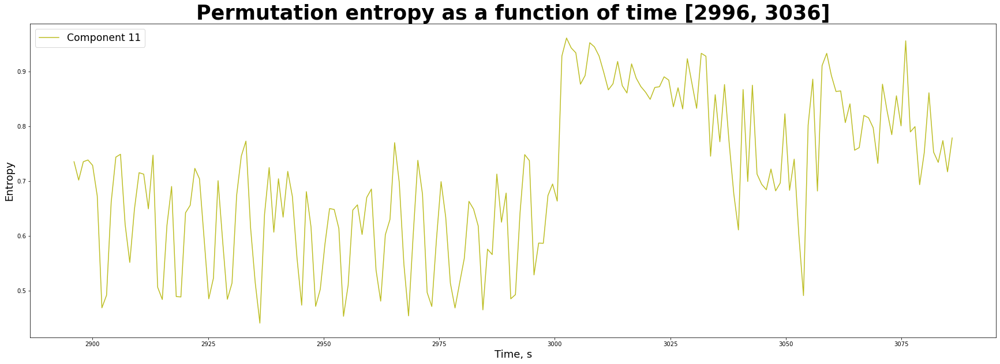

In [42]:
averaged = get_averaged_permutation_entropy(S_, 1, 4, 1, [2996, 3036], 100, 50)

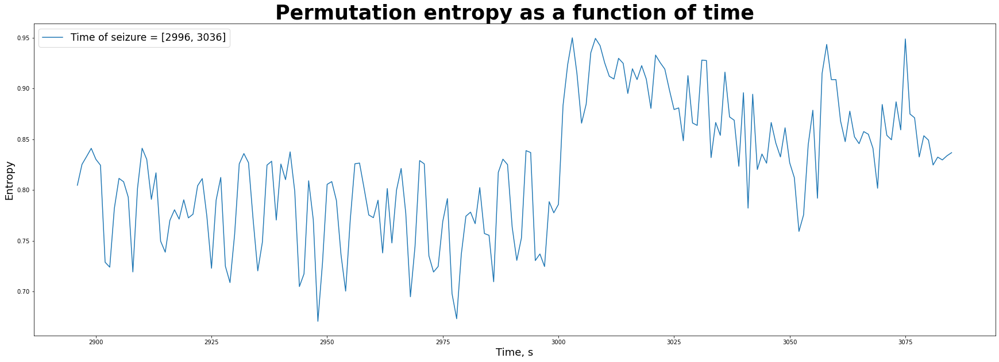

In [44]:
time_ = np.arange(2996 - 100, 3036 + 50, 1)

fig = plt.figure(figsize=(30, 10))

plt.plot(time_, averaged, COLORS[0], label="Time of seizure = [2996, 3036]")
# i += 1
plt.xlabel('Time, s', fontsize=18)
plt.ylabel('Entropy', fontsize=18)
plt.title('Permutation entropy as a function of time', weight='bold', fontsize=35)
plt.legend(fontsize='xx-large')
plt.show()

# ICA FOR THE NEXT PATIENT

Extracting EDF parameters from /Users/sofiyagarkot/Desktop/Signals/coursework/test_data/chb09/chb09_08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-45-789d0a6f1b3d>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data = mne.io.read_raw_edf(file)


<Figure size 432x288 with 0 Axes>

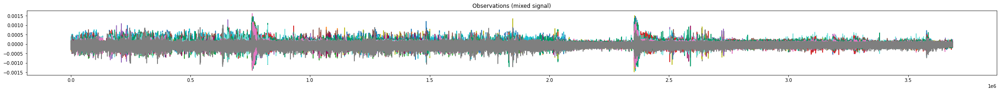

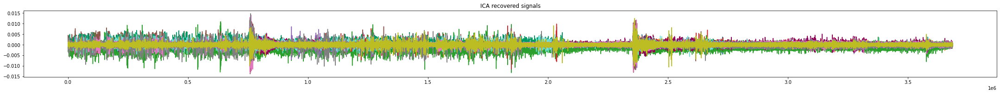

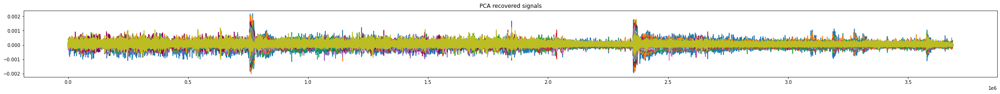

In [45]:
file = "./test_data/chb09/chb09_08.edf"
data = mne.io.read_raw_edf(file)
raw_data = data.get_data().T
raw_data.shape

ica = FastICA(n_components=12)

S_ = ica.fit_transform(raw_data)  # Reconstruct signals
A_ = ica.mixing_  # Get estimated mixing matrix

# For comparison, compute PCA
pca = PCA(n_components=12)
H = pca.fit_transform(raw_data)  # Reconstruct signals based on orthogonal components

# #############################################################################
# Plot results

plt.figure()
COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#930157', '#009966', '#72dfd9', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
         '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#930157', '#009966', '#72dfd9', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


models = [raw_data, S_, H]
names = ['Observations (mixed signal)',
         'ICA recovered signals',
         'PCA recovered signals']
colors = ['red', 'steelblue', 'orange']

for ii, (model, name) in enumerate(zip(models, names), 1):
    fig = plt.figure(figsize=(30, 10))
    plt.subplot(4, 1, ii)
    plt.title(name)
    for sig, color in zip(model.T, COLORS):
#         fig = plt.figure(figsize=(30, 10))
        plt.plot(sig, color=color)

    plt.tight_layout()
    plt.show()

# Seizure 1

Getting averaged


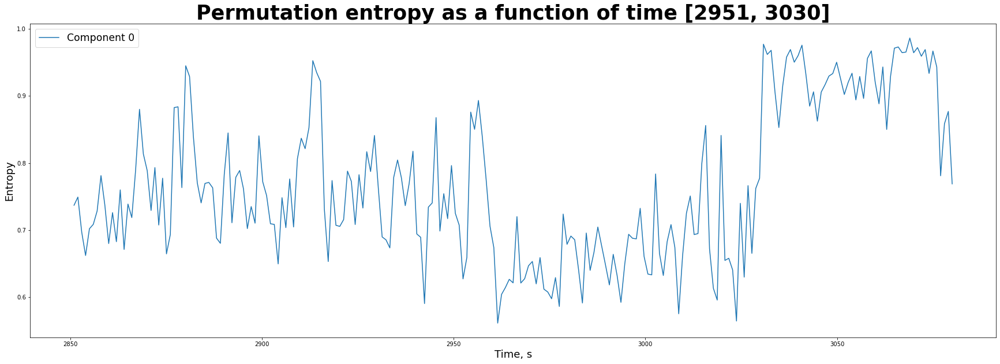

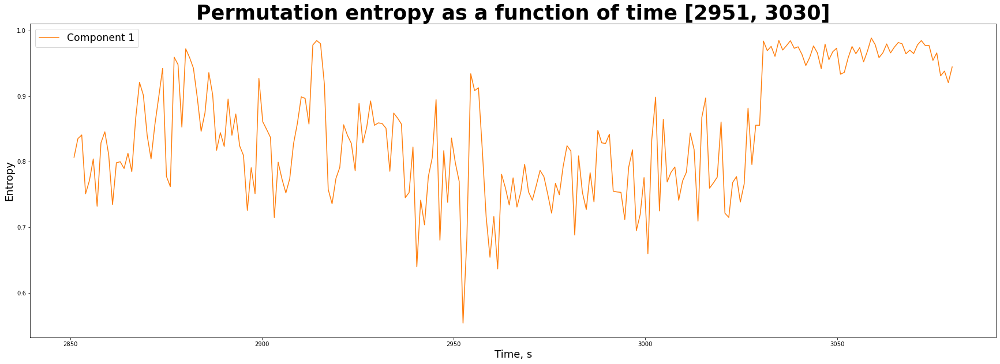

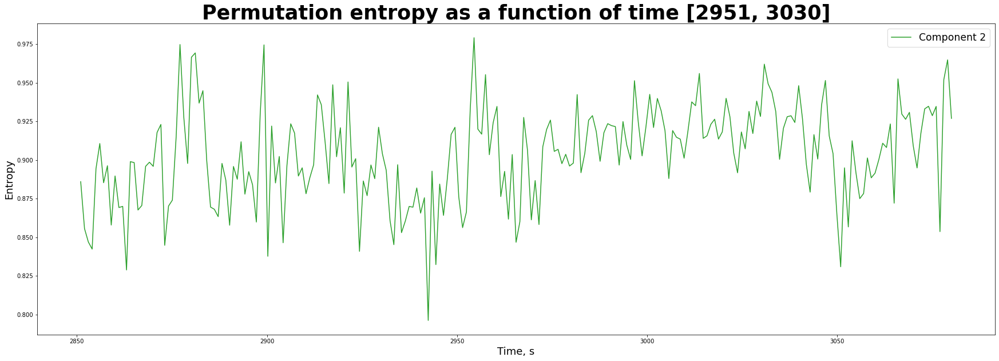

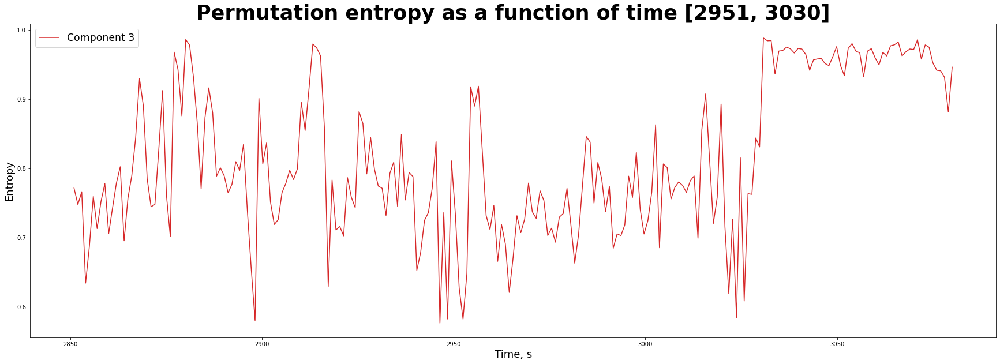

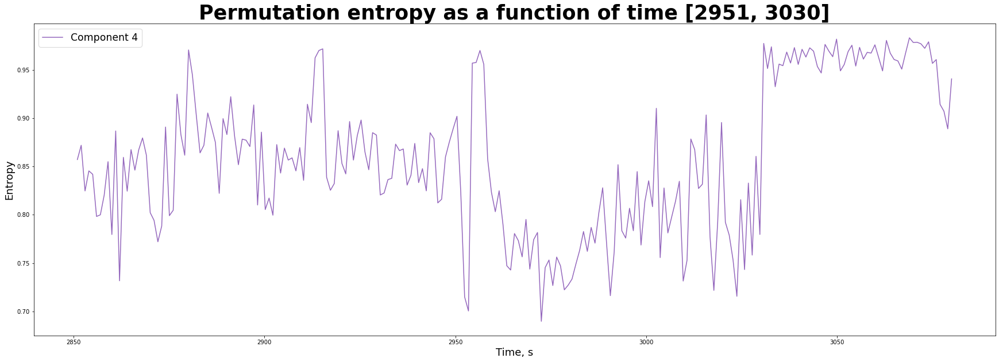

...

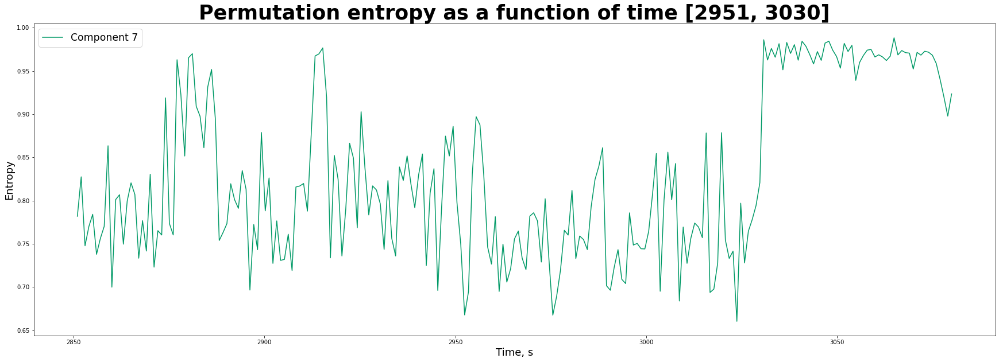

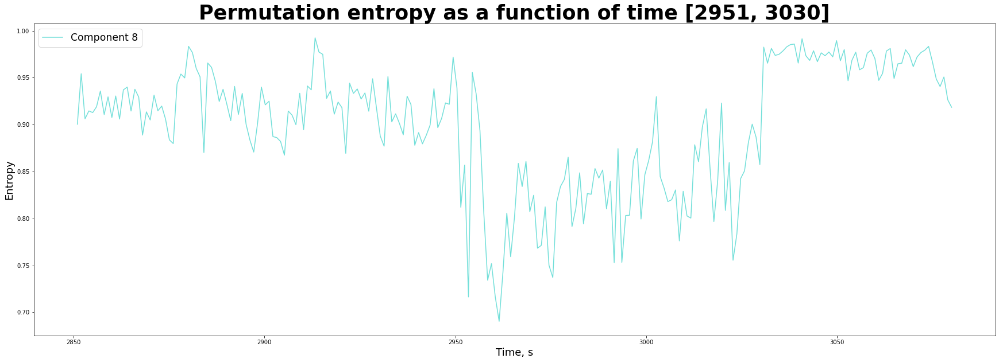

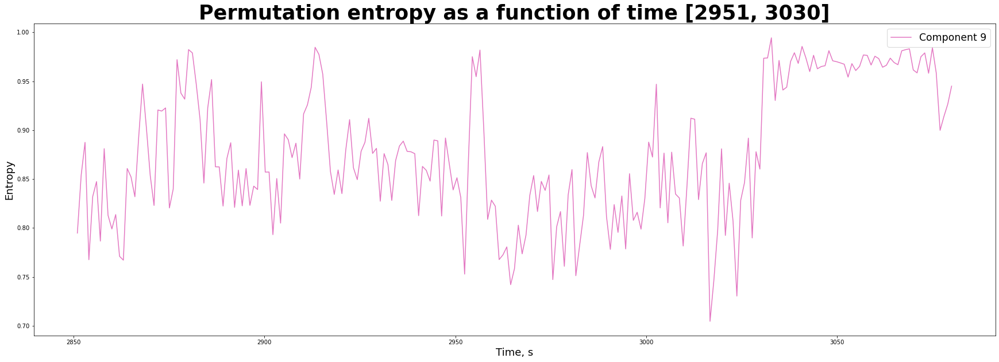

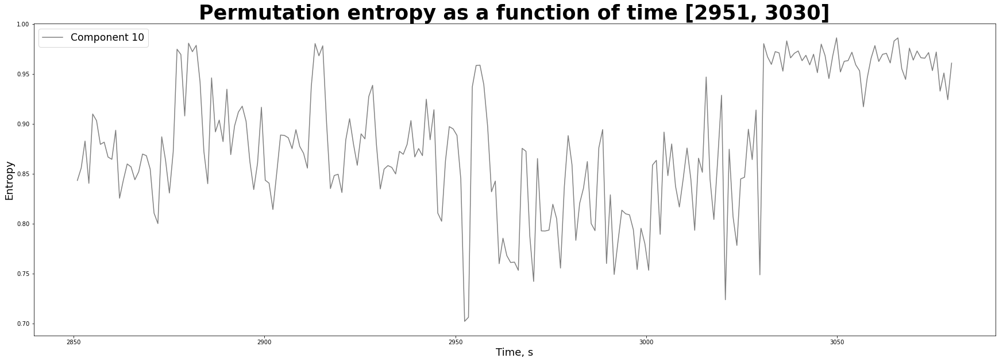

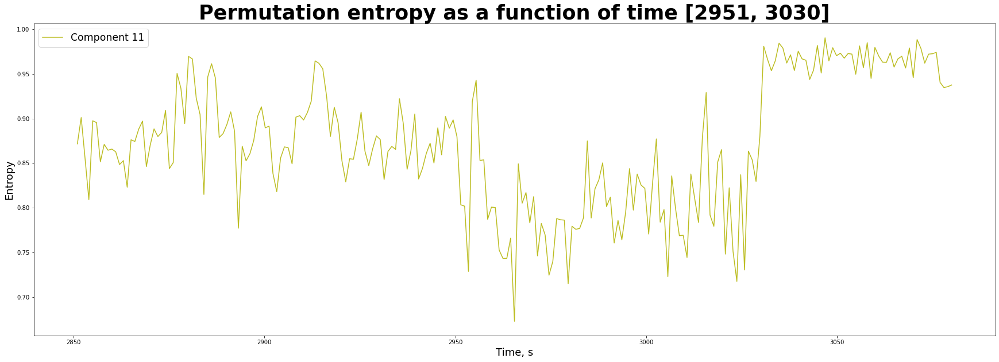

In [47]:
averaged = get_averaged_permutation_entropy(S_.T, 1, 4, 1, [2951, 3030], 100, 50)

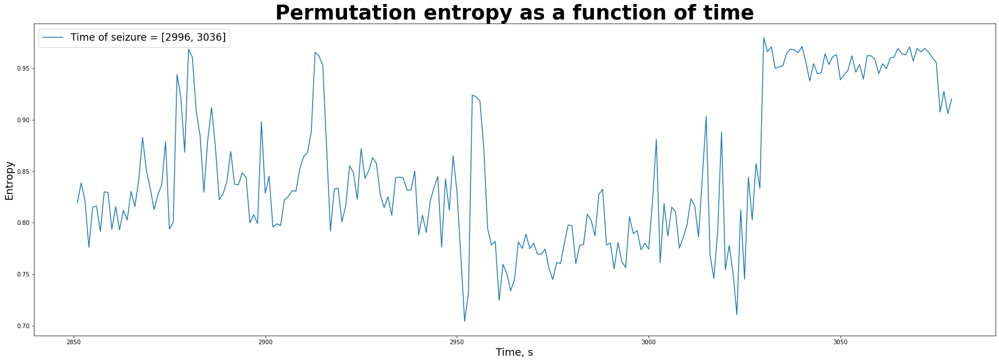

In [49]:
time_ = np.arange(2951 - 100, 3030 + 50, 1)

fig = plt.figure(figsize=(30, 10))

plt.plot(time_, averaged, COLORS[0], label="Time of seizure = [2996, 3036]")
# i += 1
plt.xlabel('Time, s', fontsize=18)
plt.ylabel('Entropy', fontsize=18)
plt.title('Permutation entropy as a function of time', weight='bold', fontsize=35)
plt.legend(fontsize='xx-large')
plt.show()

# Seizure 2

Getting averaged


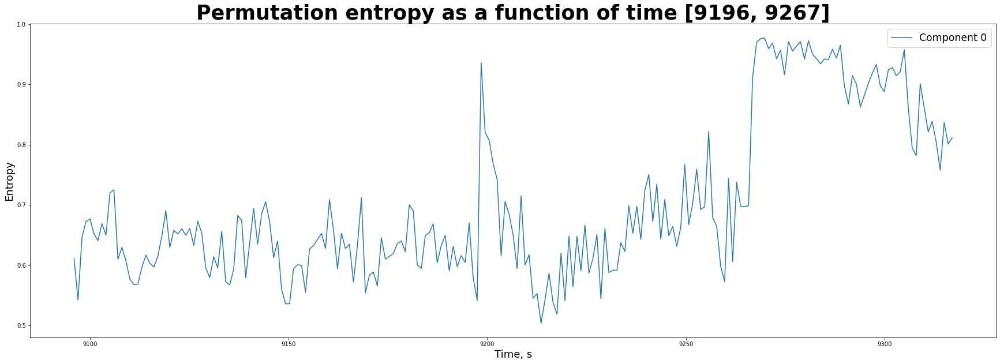

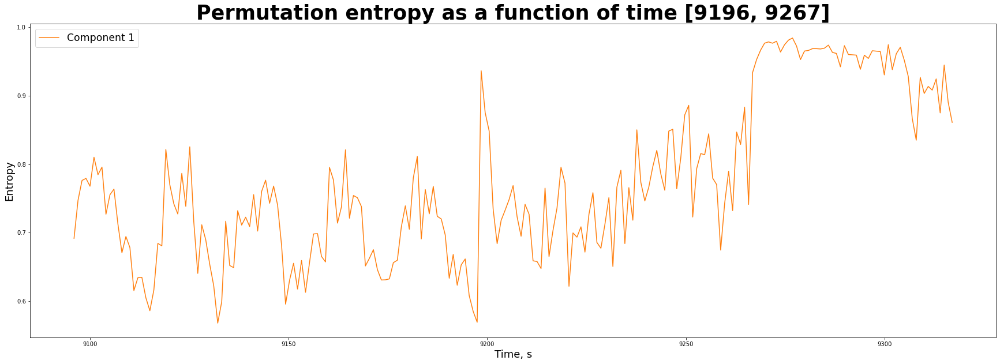

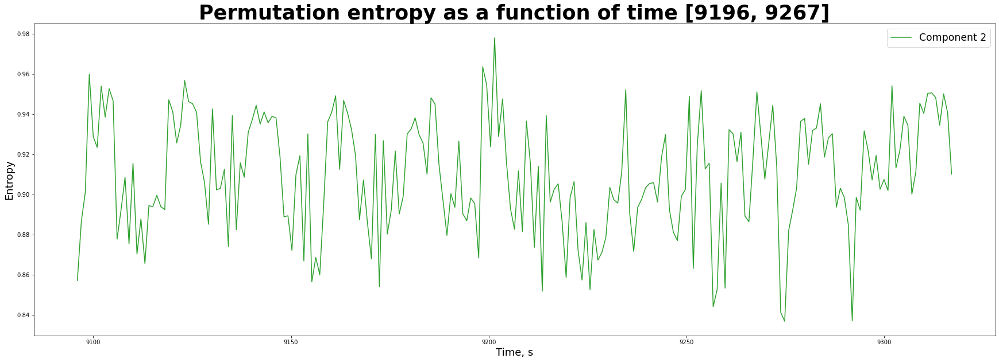

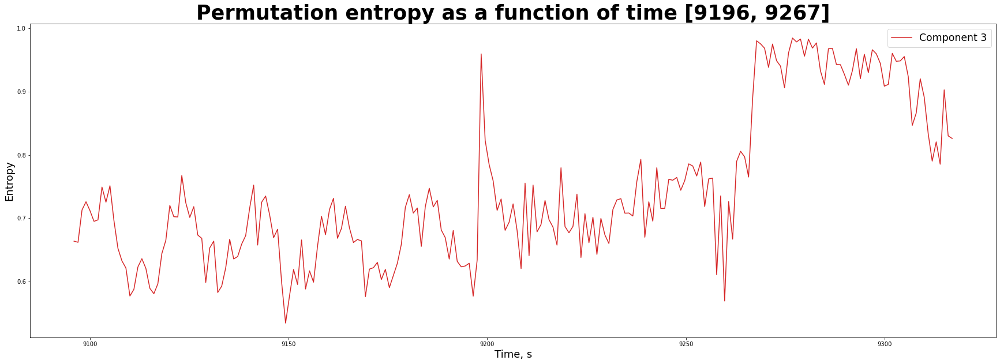

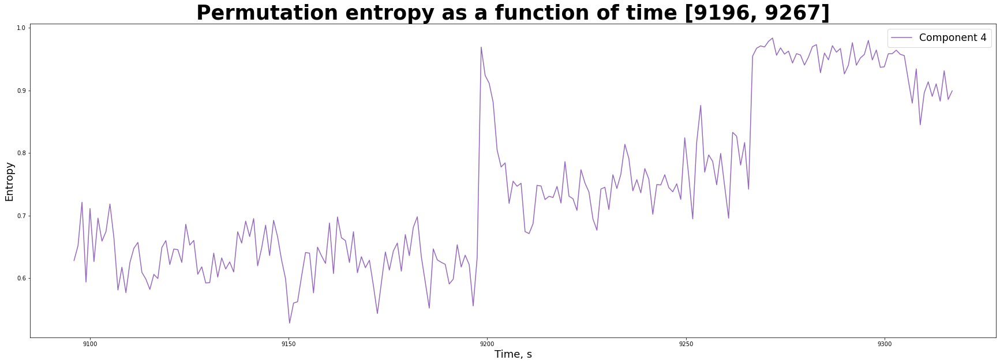

...

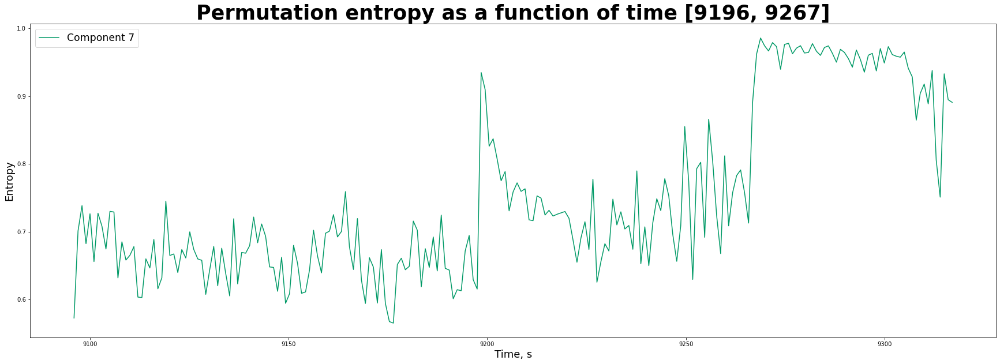

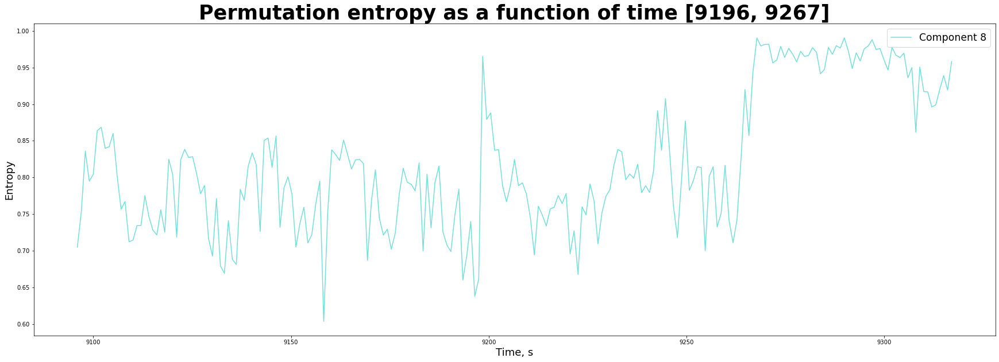

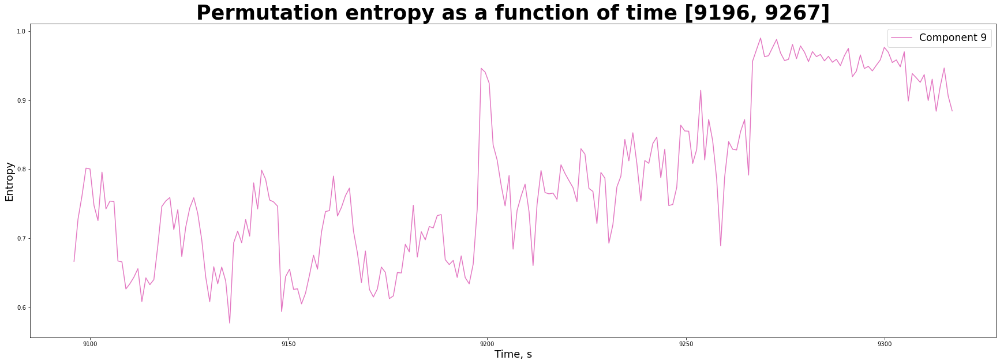

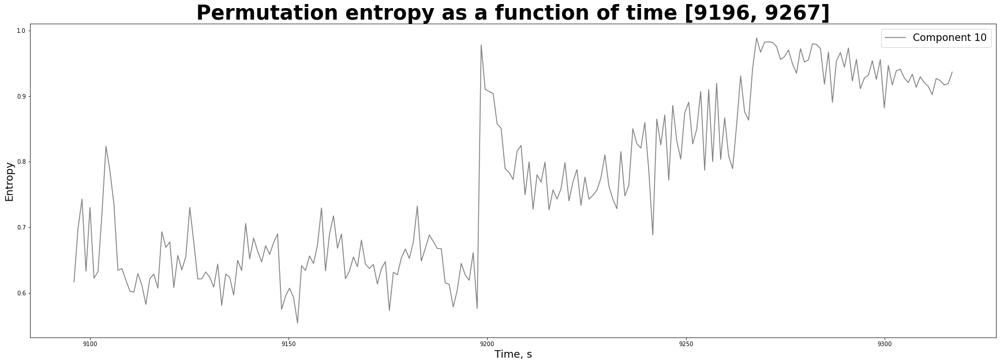

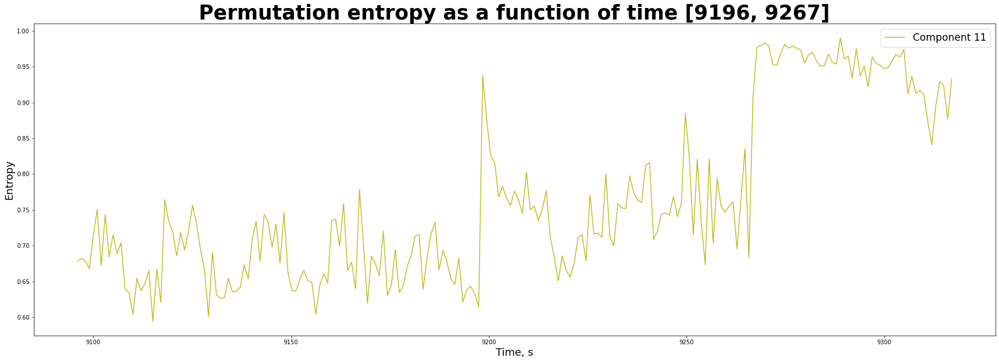

In [50]:
averaged = get_averaged_permutation_entropy(S_.T, 1, 4, 1, [9196, 9267], 100, 50)

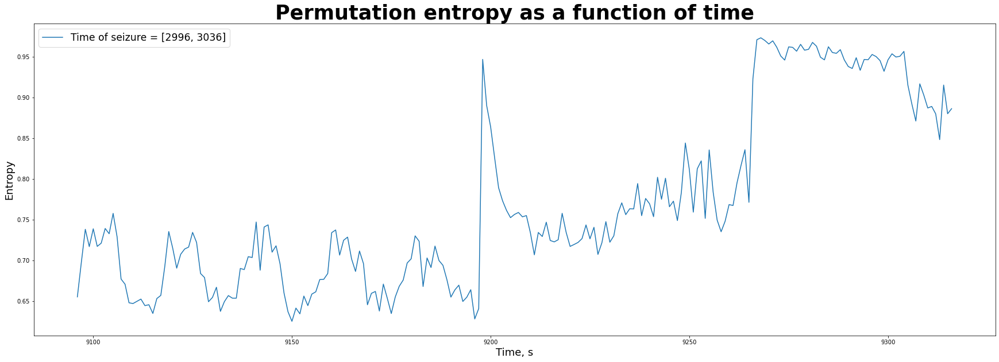

In [51]:
time_ = np.arange(9196 - 100, 9267 + 50, 1)

fig = plt.figure(figsize=(30, 10))

plt.plot(time_, averaged, COLORS[0], label="Time of seizure = [2996, 3036]")
# i += 1
plt.xlabel('Time, s', fontsize=18)
plt.ylabel('Entropy', fontsize=18)
plt.title('Permutation entropy as a function of time', weight='bold', fontsize=35)
plt.legend(fontsize='xx-large')
plt.show()